# Analyzing Bigrams (N = 2)

## Importing Packages

In [11]:
import pandas as pd
import numpy as np
import regex as re
import nltk
from nltk.corpus import stopwords
from collections import Counter
from wordcloud import WordCloud
from matplotlib import pyplot as plt
import math

## Downloading Stopwords

In [2]:
nltk.download('stopwords')
stopwords = set(nltk.corpus.stopwords.words('english'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


## Reading CSV

In [3]:
df = pd.read_csv("un-general-debates-blueprint.csv")

## Defining Methods for Bigram Analysis

In [4]:
def tokenize(text):
	return re.findall(r'[\w-]*\p{L}[\w-]*', text)

def prepare(text):
	tokens = text
	for transform in pipeline:
		tokens = transform(tokens)
	return tokens

def bigrams(tokens):
	return [' '.join(ngram) for ngram in zip(*[tokens[i:] for i in range(2)])
              if len([t for t in ngram if t in stopwords])==0]

## Defining Pipeline

In [5]:
pipeline = [str.lower, tokenize]

## Evaluating and Storing Bigrams

In [6]:
df['bigrams'] = df['text'].map(prepare).map(bigrams)

## Evaluating and Storing Number of Bigrams

In [7]:
counter = Counter()
df['bigrams'].map(lambda x: counter.update(set(x)))
N = len(df)

## Evaluating IDF

In [8]:
newCounter = dict(filter(lambda x: x[1] >= 10, counter.items()))
idf = dict(map(lambda x: (x[0], np.log(N/x[1]) + 0.1), newCounter.items()))

## Word-Clouds for Bigrams, based on TF-IDF. (grouped by year)

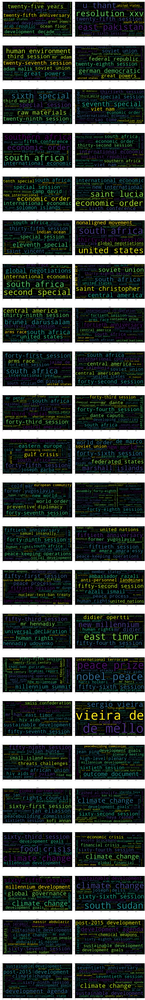

In [44]:
l_year = 1970
h_year = 2016
clouds = h_year - l_year
rows = math.ceil(clouds / 2)
fig, ax = plt.subplots(rows, 2, figsize=(25, 7.5 * rows))
for ind, y in enumerate(range(l_year, h_year)):
  counter.clear()
  df[df['year'] == y]['bigrams'].map(counter.update)
  newCounter = dict(filter(lambda x: x[0] in idf, counter.items()))
  tfidf = dict(map(lambda x: (x[0], x[1] * idf.get(x[0])), newCounter.items()))
  wc = WordCloud()
  wc.generate_from_frequencies(tfidf)
  ax[ind // 2][ind % 2].imshow(wc, interpolation='bilinear')
  ax[ind // 2][ind % 2].set_title(str(y))
plt.tight_layout()